In [ ]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[["latent_z0", "latent_z1"]].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.scatter(adata, x="latent_z0", y="latent_z1", color="batch",
                  ax=axes[0], show=False, title=f"Ground truth z ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()

In [1]:
import sys
sys.path.insert(0, "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation")

from sigma_sweep import rho_for_run

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/torch/cuda/__init__.py:54: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scvi/__init__.py:31: DeprecationWarning: scvi is deprecated, please uninstall scvi via `pip uninstall scvi` and install the new scvi-tools package at github.com/YosefLab/scvi-tools
  warnings.warn(deprecation_msg, DeprecationWarning)


## Create simulated data and train models
Sigma sweep at 0.1, 0.5, 1.0, 2.0, 5.0, 7.5, 10.0.   
Seeds at 0, 1, 2, 3, 4

Epoch 350 (batch 24/24) | | train elbo: 94.97 (last epoch: 95.06) | val ll: 95.37:  35%|███▌      | 350/1000 [01:29<02:46,  3.89it/s]2026-07-20 04:19:39,694 | INFO : Early stopping has been triggered.
2026-07-20 04:19:39,697 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-07-20 04:19:39,697 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-07-20 04:19:39,697 | INFO : Saving decipher model with run_id 2026-07-20-04-19-39-forward-emerald-brownian.


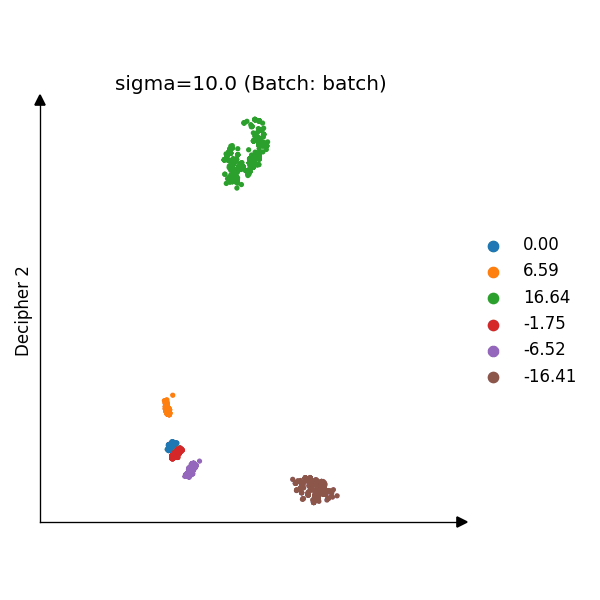

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
2026-07-20 04:19:41,000 | INFO : Clustering cells using scanpy Leiden algorithm.
2026-07-20 04:19:41,000 | INFO : Step 1: Computing neighbors with `sc.pp.neighbors`, with the representation decipher_z.
2026-07-20 04:19:41,026 | INFO : Step 2: Computing clusters with `sc.tl.leiden`, and resolution 0.05.
2026-07-20 04:19:41,244 | INFO : Added `.obs['decipher_clusters']`: the cluster labels.
/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Data Generation/sigma_sweep.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default an

,model,sigma,seed,rho,ground_truth_h5ad,trained_h5ad
0,Base Decipher,0.1,0,0.940194,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
1,Base Decipher,0.1,1,0.940448,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
2,Base Decipher,0.1,2,0.909276,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
3,Base Decipher,0.1,3,0.921711,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
4,Base Decipher,0.1,4,0.935896,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
...,...,...,...,...,...,...
135,Decipher-MF,10.0,0,0.811066,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
136,Decipher-MF,10.0,1,0.427052,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
137,Decipher-MF,10.0,2,0.162751,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...
138,Decipher-MF,10.0,3,0.367351,/Users/alanxie/CodingProjects/Columbia/Azizi L...,/Users/alanxie/CodingProjects/Columbia/Azizi L...


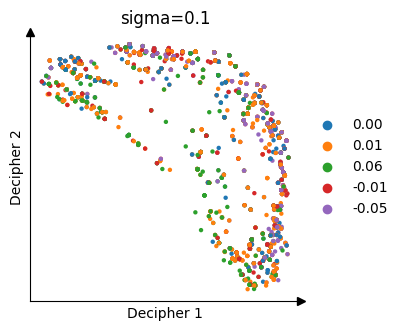

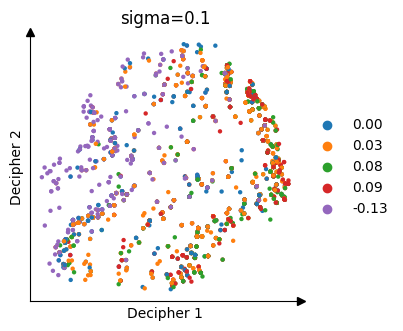

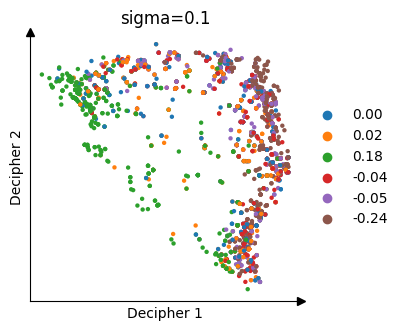

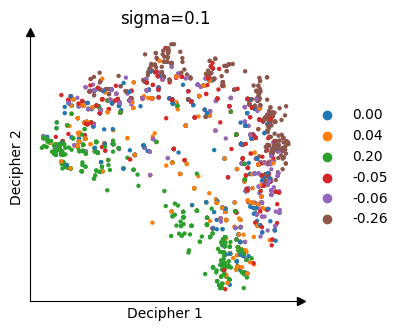

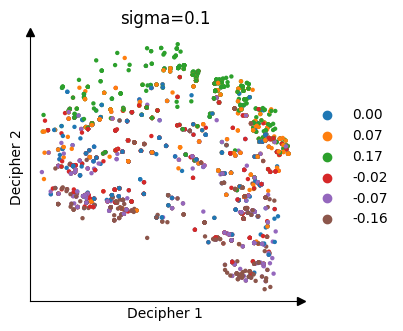

...

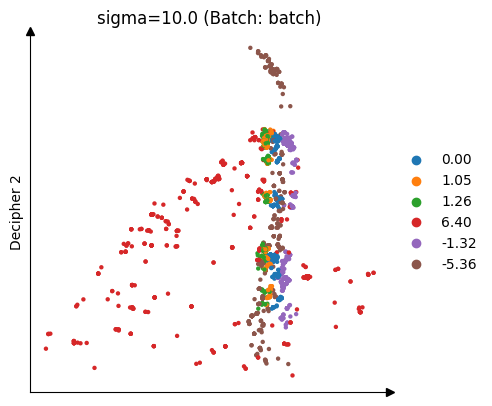

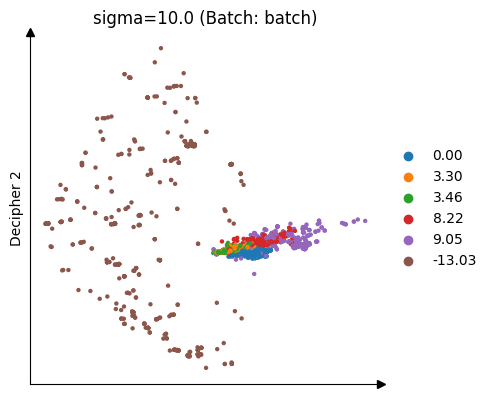

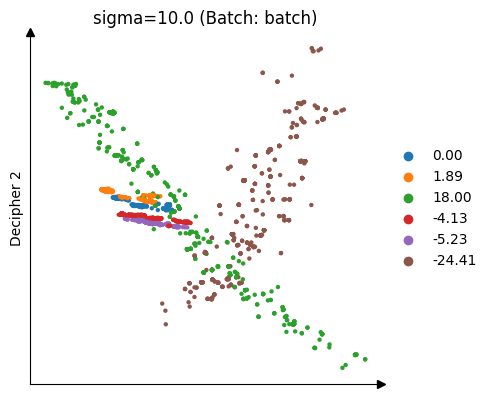

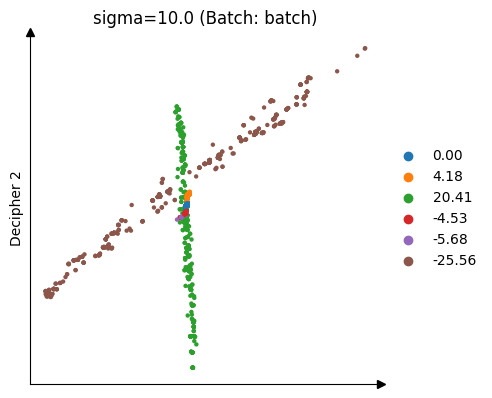

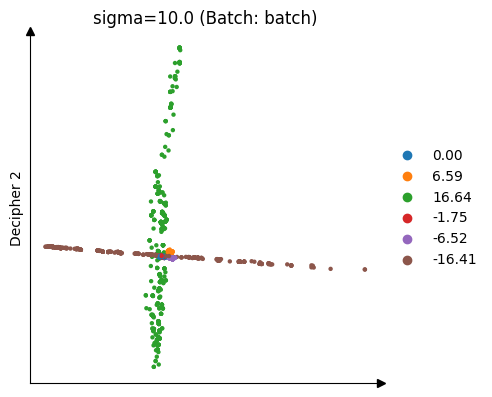

In [2]:
import os
import pandas as pd

results_dir = "/Users/alanxie/CodingProjects/Columbia/Azizi Lab/Spatial Nut Carcinoma/decipher-bc-methods/Data/Simulated Data/Simulated Adata/v-to-z/trained"
os.makedirs(results_dir, exist_ok=True)

models = {
    "Base Decipher": "decipher",
    "Decipher-VZ": "decipher_vz",
    "Decipher-VZ2": "decipher_vz2",
    "Decipher-MF": "decipher_mf",
}

records = []
for model_name, model_tag in models.items():
    for sigma in [0.1, 0.5, 1.0, 2.0, 5.0, 7.5, 10.0]:
        for seed in [0, 1, 2, 3, 4]:
            rho, gt_path, trained_path, adata = rho_for_run(sigma=sigma, seed=seed, model=model_tag, decipher_seed=1)
            records.append({
                "model": model_name,
                "sigma": sigma,
                "seed": seed,
                "rho": rho,
                "ground_truth_h5ad": gt_path,
                "trained_h5ad": trained_path,
            })

results_df = pd.DataFrame(records)
results_df.to_csv("sigma_sweep_results.csv", index=False)
results_df

## Correlation Plot

2026-07-20 10:14:29,722 | INFO : Substituting symbol N from STIXNonUnicode
2026-07-20 10:14:30,185 | INFO : Substituting symbol N from STIXNonUnicode
2026-07-20 10:14:30,231 | INFO : Substituting symbol N from STIXNonUnicode
2026-07-20 10:14:30,258 | INFO : Substituting symbol N from STIXNonUnicode


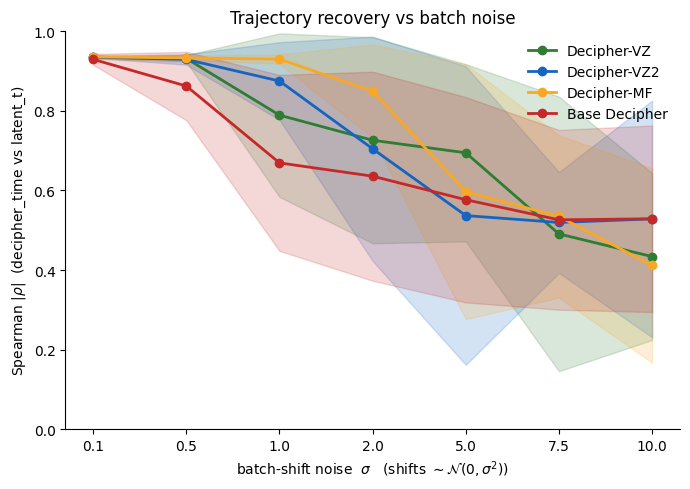

In [6]:
import numpy as np
import matplotlib.pyplot as plt

models = {
        "Decipher-VZ": "decipher_vz",
        "Decipher-VZ2": "decipher_vz2",
        "Decipher-MF": "decipher_mf",
        "Base Decipher": "decipher",
    }

colors = {
        "Decipher-VZ": "#2E7D32",
        "Decipher-VZ2": "#1565C0",
        "Decipher-MF": "#F9A825",
        "Base Decipher": "#C62828",
    }

sigmas = sorted(results_df["sigma"].unique())
x_pos = np.arange(len(sigmas))  # evenly spaced positions, one per sigma tested

fig, ax = plt.subplots(figsize=(7, 5))
for name in models:
    sub = results_df[results_df["model"] == name]
    stats = sub.groupby("sigma")["rho"].agg(["mean", "std"]).reindex(sigmas)
    mean = stats["mean"].to_numpy()
    sd_ = stats["std"].to_numpy()
    ax.plot(x_pos, mean, marker="o", color=colors[name], label=name, linewidth=2)
    ax.fill_between(x_pos, mean - sd_, mean + sd_, color=colors[name], alpha=0.18)

ax.set_xticks(x_pos)
ax.set_xticklabels([str(s) for s in sigmas])
ax.set_xlabel(r"batch-shift noise  $\sigma$   (shifts $\sim \mathcal{N}(0,\sigma^2)$)")
ax.set_ylabel(r"Spearman $|\rho|$  (decipher_time vs latent_t)")
ax.set_title("Trajectory recovery vs batch noise")
ax.set_ylim(0, 1); ax.axhline(0, color="0.8", lw=0.8)
ax.legend(frameon=False); ax.spines[["top", "right"]].set_visible(False)
fig.tight_layout()
fig.savefig("sigma_vs_correlation.png", dpi=200)
plt.show()

In [19]:
rho_summary = (
    results_df.groupby(["sigma", "model"])["rho"]
    .agg(["mean", "std"])
    .unstack("model")
    .swaplevel(axis=1)
    .sort_index(axis=1, level=0)
    .reindex(sigmas)
    .round(3)
)
rho_summary

model Base Decipher        Decipher-MF        Decipher-VZ        Decipher-VZ2  \
               mean    std        mean    std        mean    std         mean   
sigma                                                                           
0.1           0.930  0.014       0.936  0.005       0.934  0.001        0.936   
0.5           0.862  0.086       0.933  0.005       0.932  0.008        0.929   
1.0           0.669  0.221       0.930  0.012       0.789  0.206        0.875   
2.0           0.636  0.263       0.850  0.118       0.726  0.259        0.705   
5.0           0.577  0.258       0.597  0.320       0.695  0.223        0.537   
7.5           0.526  0.226       0.535  0.204       0.491  0.345        0.519   
10.0          0.529  0.234       0.411  0.244       0.434  0.210        0.529   

model         
         std  
sigma         
0.1    0.002  
0.5    0.013  
1.0    0.098  
2.0    0.282  
5.0    0.375  
7.5    0.127  
10.0   0.298

## Sigma = 0.5

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


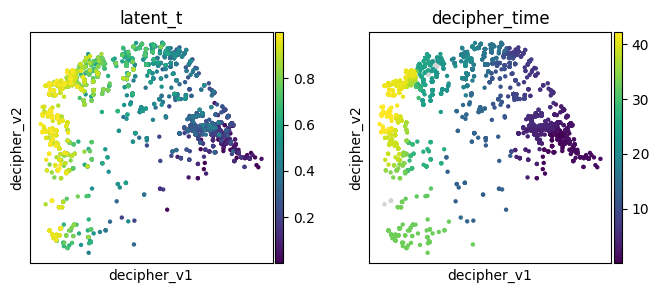

Base Decipher, sigma=0.5, seed=0, rho = 0.9359


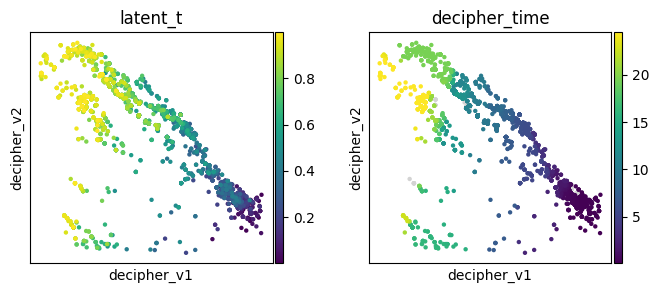

Decipher-VZ, sigma=0.5, seed=0, rho = 0.9376


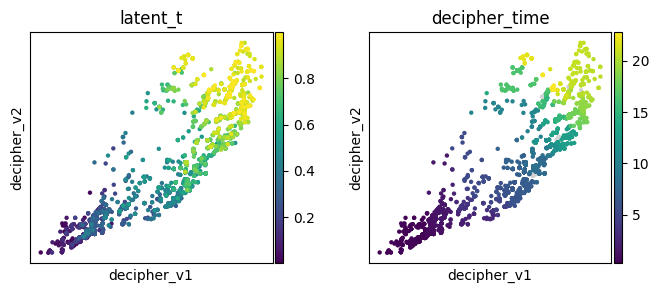

Decipher-VZ2, sigma=0.5, seed=0, rho = 0.9411


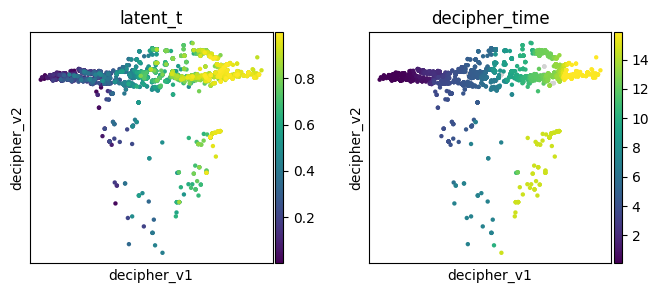

Decipher-MF, sigma=0.5, seed=0, rho = 0.9299


In [7]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def load_run(results_df, sigma, model_name):
    row = results_df[(results_df["sigma"] == sigma) & (results_df["model"] == model_name)].iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

model_names = ["Base Decipher", "Decipher-VZ", "Decipher-VZ2", "Decipher-MF"]

sigma = 0.5
runs = {name: load_run(results_df, sigma, name) for name in model_names}

for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")


Base Decipher  sigma=0.5  ground truth z silhouette (by batch) = 0.0203
Base Decipher  sigma=0.5  learned decipher_z silhouette (by batch) = -0.0205


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


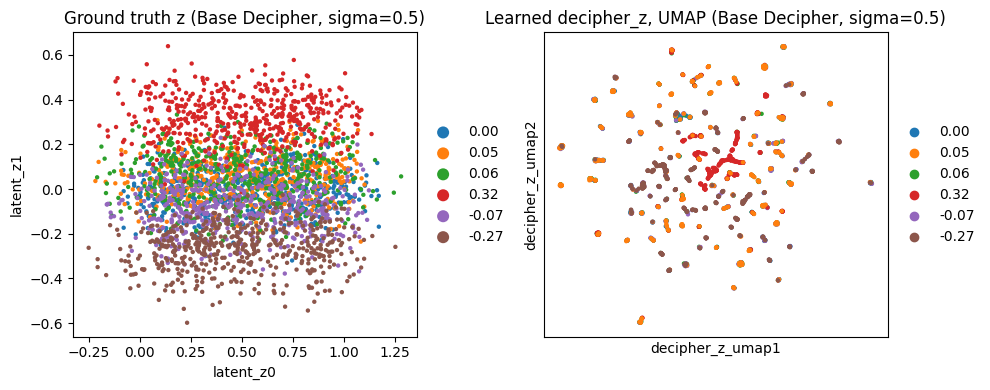

Decipher-VZ  sigma=0.5  ground truth z silhouette (by batch) = 0.0203
Decipher-VZ  sigma=0.5  learned decipher_z silhouette (by batch) = 0.0026


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


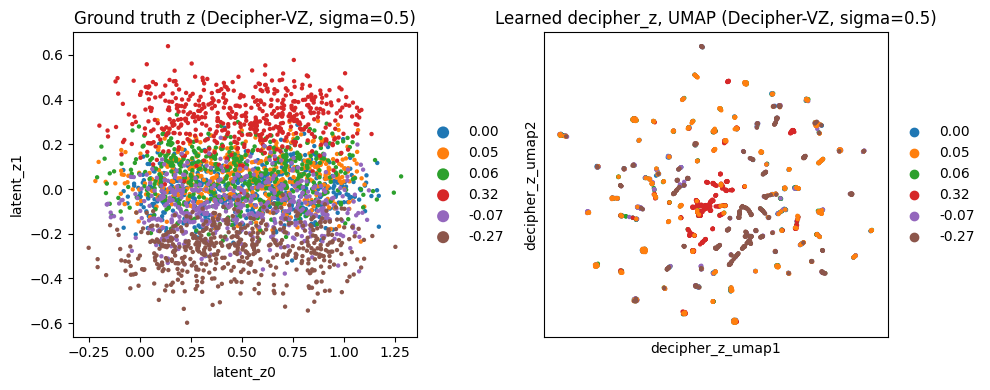

Decipher-VZ2  sigma=0.5  ground truth z silhouette (by batch) = 0.0203
Decipher-VZ2  sigma=0.5  learned decipher_z silhouette (by batch) = -0.0225


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


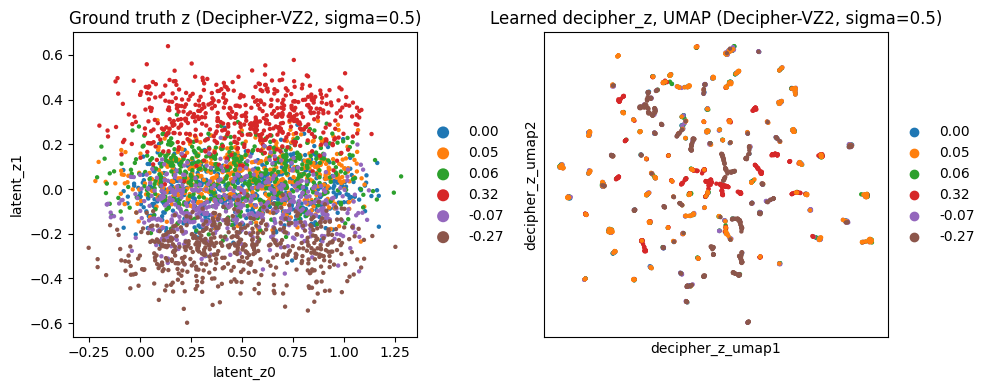

Decipher-MF  sigma=0.5  ground truth z silhouette (by batch) = 0.0203
Decipher-MF  sigma=0.5  learned decipher_z silhouette (by batch) = -0.0590


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


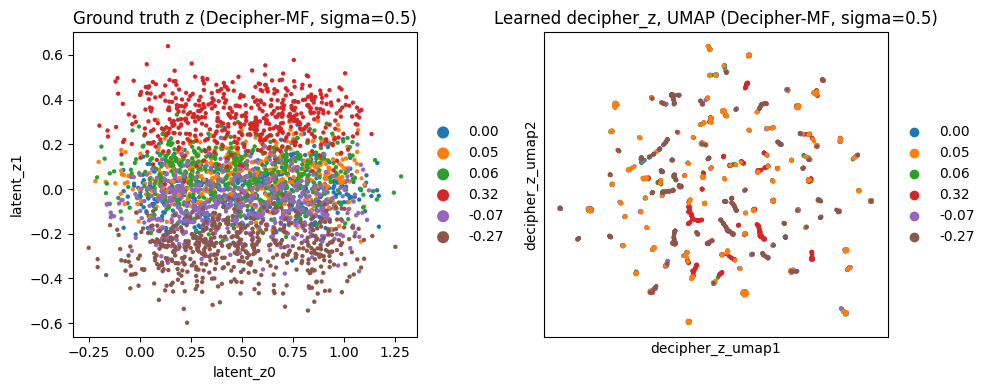

In [8]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[["latent_z0", "latent_z1"]].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.scatter(adata, x="latent_z0", y="latent_z1", color="batch",
                  ax=axes[0], show=False, title=f"Ground truth z ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()


## Sigma = 2.0

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


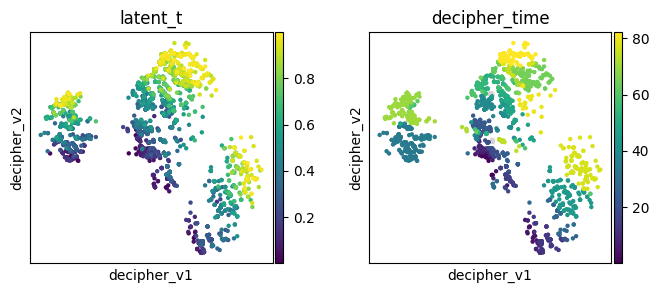

Base Decipher, sigma=2.0, seed=0, rho = 0.8400


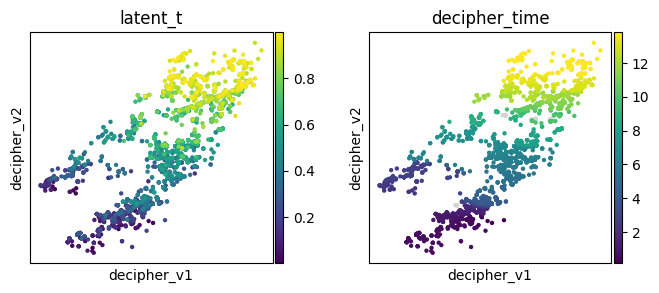

Decipher-VZ, sigma=2.0, seed=0, rho = 0.9343


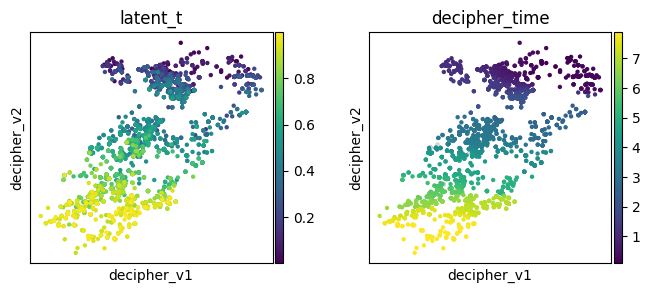

Decipher-VZ2, sigma=2.0, seed=0, rho = 0.9354


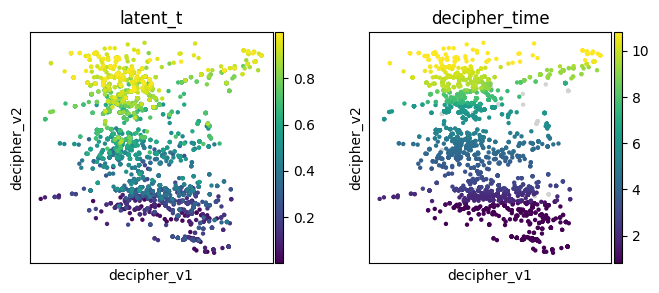

Decipher-MF, sigma=2.0, seed=0, rho = 0.9363


In [9]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def load_run(results_df, sigma, model_name):
    row = results_df[(results_df["sigma"] == sigma) & (results_df["model"] == model_name)].iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

model_names = ["Base Decipher", "Decipher-VZ", "Decipher-VZ2", "Decipher-MF"]

sigma = 2.0
runs = {name: load_run(results_df, sigma, name) for name in model_names}

for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")


Base Decipher  sigma=2.0  ground truth z silhouette (by batch) = 0.2415
Base Decipher  sigma=2.0  learned decipher_z silhouette (by batch) = 0.2265


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


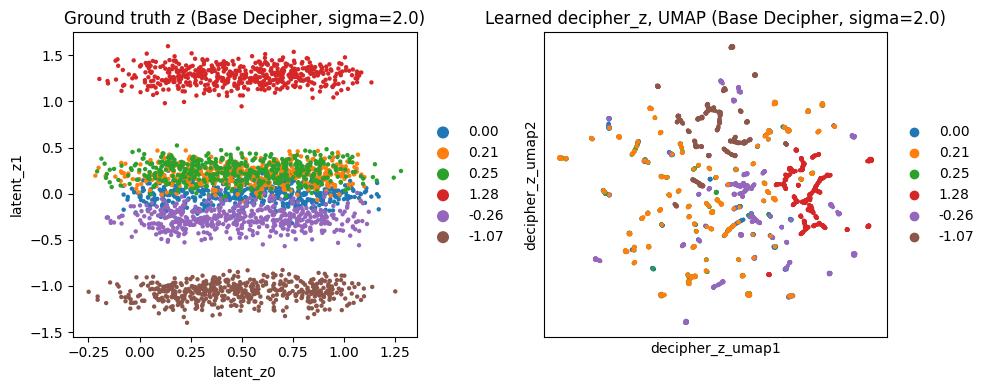

Decipher-VZ  sigma=2.0  ground truth z silhouette (by batch) = 0.2415
Decipher-VZ  sigma=2.0  learned decipher_z silhouette (by batch) = 0.1787


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


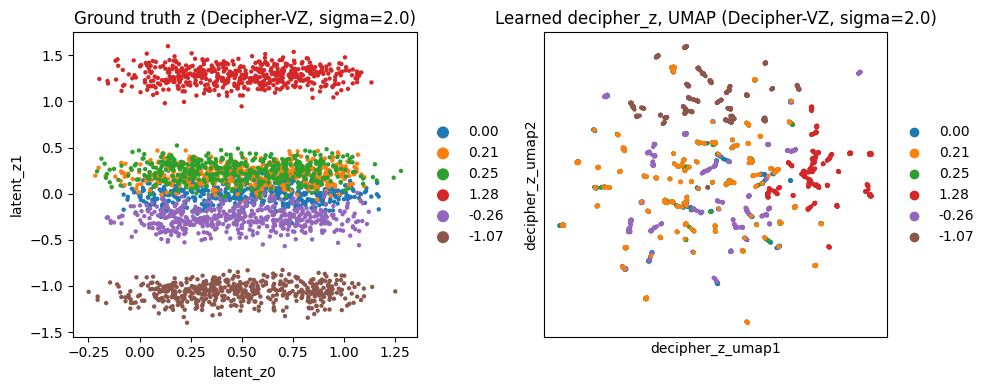

Decipher-VZ2  sigma=2.0  ground truth z silhouette (by batch) = 0.2415
Decipher-VZ2  sigma=2.0  learned decipher_z silhouette (by batch) = 0.0651


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


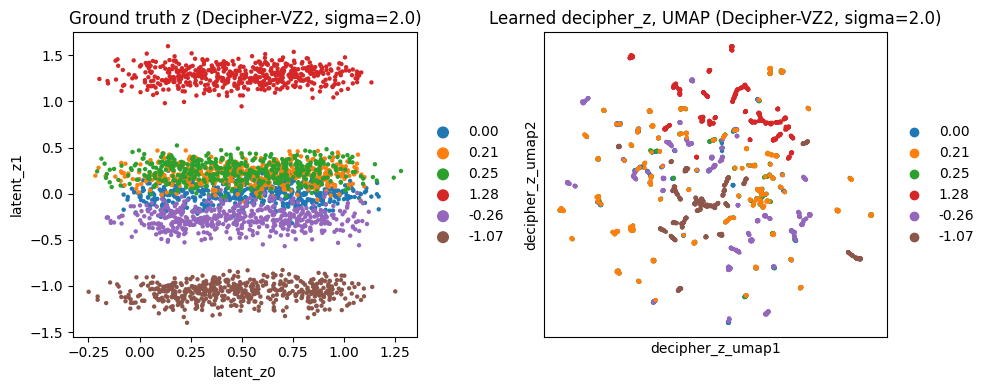

Decipher-MF  sigma=2.0  ground truth z silhouette (by batch) = 0.2415
Decipher-MF  sigma=2.0  learned decipher_z silhouette (by batch) = 0.0241


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


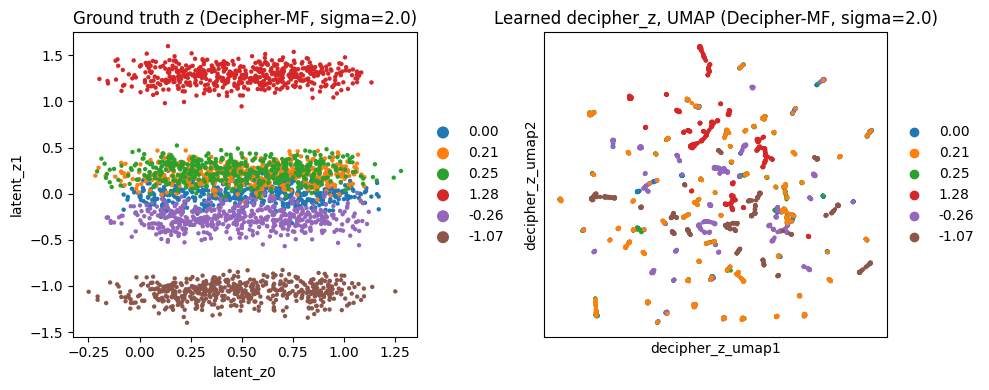

In [10]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[["latent_z0", "latent_z1"]].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.scatter(adata, x="latent_z0", y="latent_z1", color="batch",
                  ax=axes[0], show=False, title=f"Ground truth z ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()


## Sigma = 5.0

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


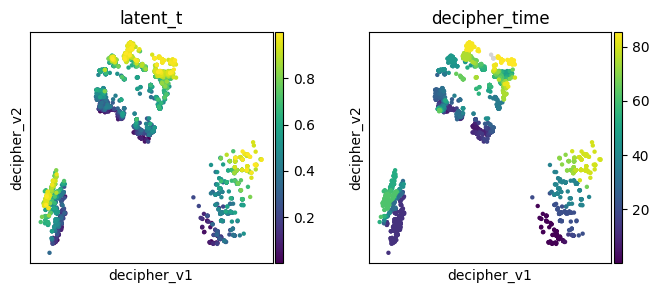

Base Decipher, sigma=5.0, seed=0, rho = 0.8337


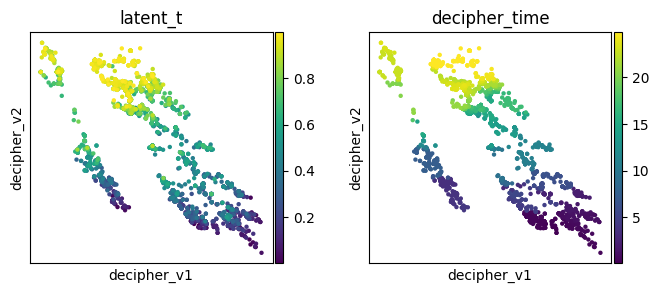

Decipher-VZ, sigma=5.0, seed=0, rho = 0.9183


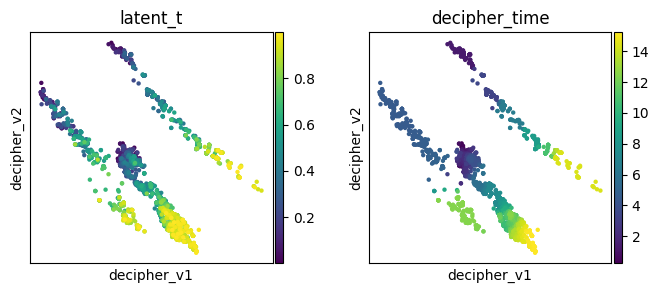

Decipher-VZ2, sigma=5.0, seed=0, rho = 0.8972


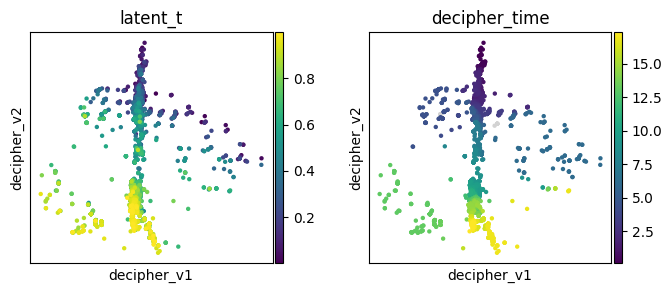

Decipher-MF, sigma=5.0, seed=0, rho = 0.8992


In [11]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def load_run(results_df, sigma, model_name):
    row = results_df[(results_df["sigma"] == sigma) & (results_df["model"] == model_name)].iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

model_names = ["Base Decipher", "Decipher-VZ", "Decipher-VZ2", "Decipher-MF"]

sigma = 5.0
runs = {name: load_run(results_df, sigma, name) for name in model_names}

for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")


Base Decipher  sigma=5.0  ground truth z silhouette (by batch) = 0.4381
Base Decipher  sigma=5.0  learned decipher_z silhouette (by batch) = 0.3061


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


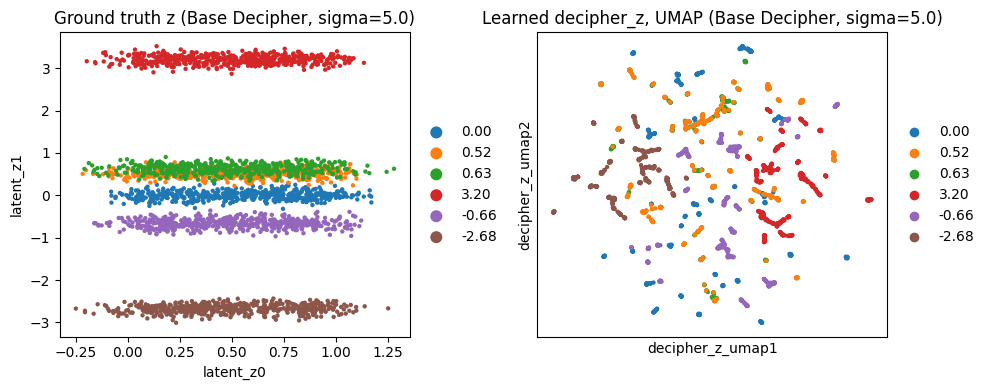

Decipher-VZ  sigma=5.0  ground truth z silhouette (by batch) = 0.4381
Decipher-VZ  sigma=5.0  learned decipher_z silhouette (by batch) = 0.2475


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


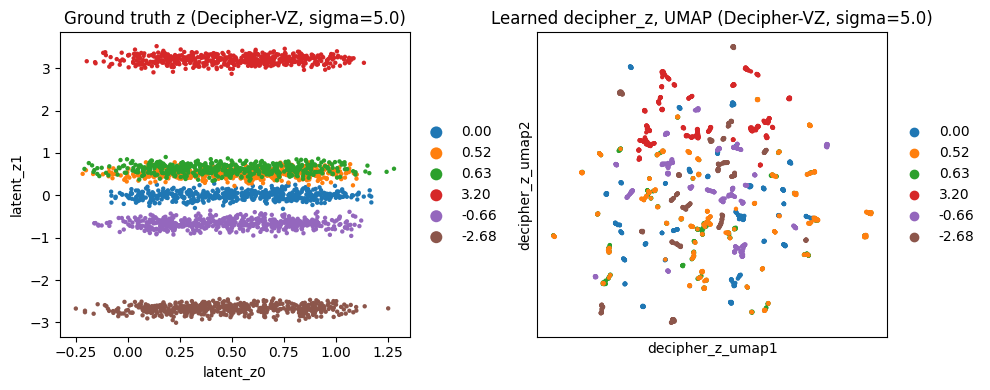

Decipher-VZ2  sigma=5.0  ground truth z silhouette (by batch) = 0.4381
Decipher-VZ2  sigma=5.0  learned decipher_z silhouette (by batch) = 0.2493


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


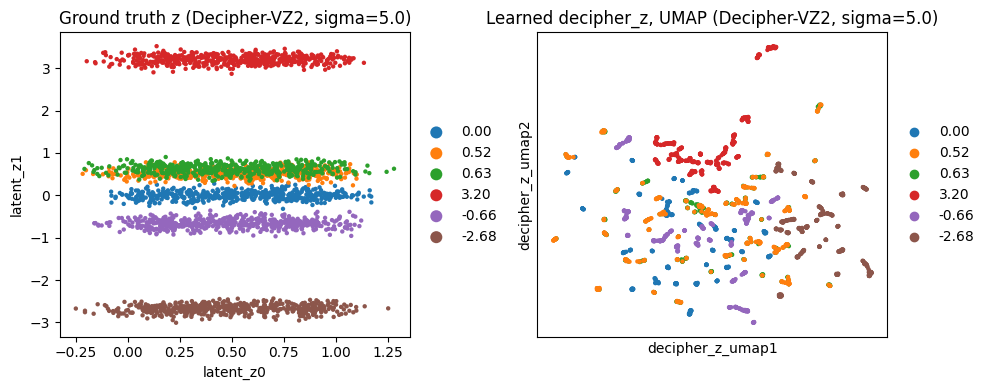

Decipher-MF  sigma=5.0  ground truth z silhouette (by batch) = 0.4381
Decipher-MF  sigma=5.0  learned decipher_z silhouette (by batch) = 0.1538


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


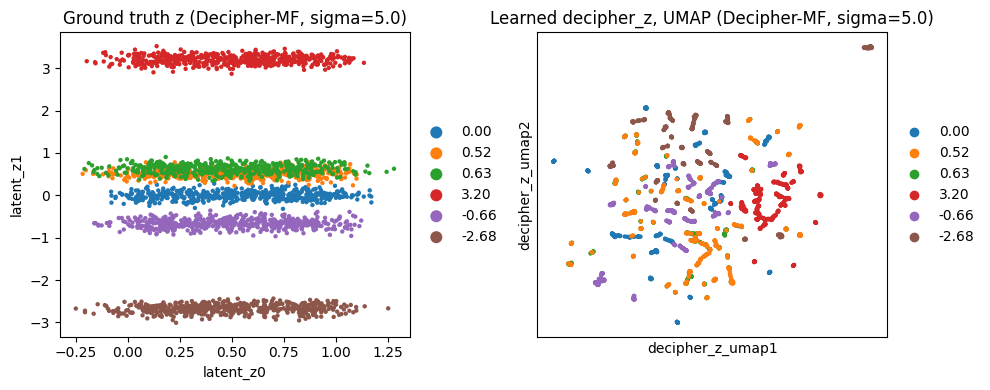

In [12]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[["latent_z0", "latent_z1"]].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.scatter(adata, x="latent_z0", y="latent_z1", color="batch",
                  ax=axes[0], show=False, title=f"Ground truth z ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()


## Sigma = 10.0

/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


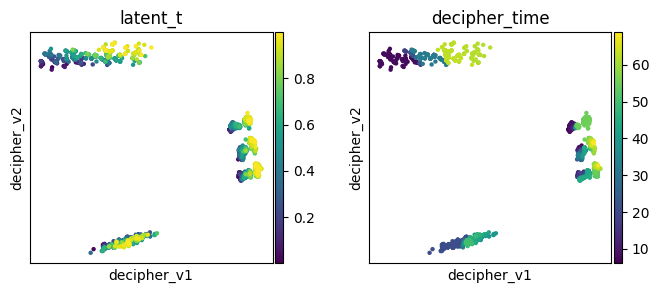

Base Decipher, sigma=10.0, seed=0, rho = 0.7773


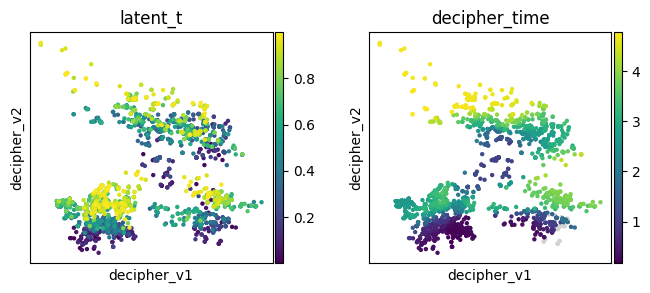

Decipher-VZ, sigma=10.0, seed=0, rho = 0.5669


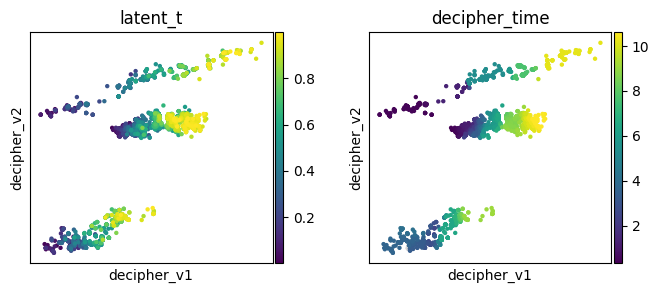

Decipher-VZ2, sigma=10.0, seed=0, rho = 0.8824


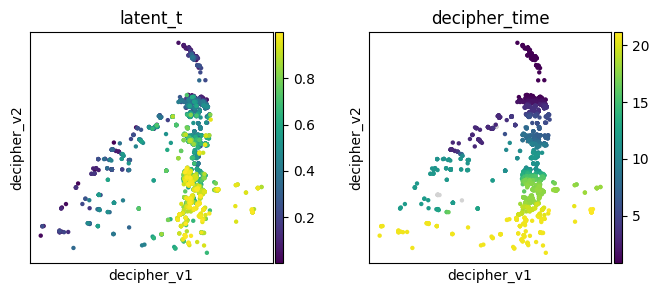

Decipher-MF, sigma=10.0, seed=0, rho = 0.8111


In [13]:
import scanpy as sc
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def load_run(results_df, sigma, model_name):
    row = results_df[(results_df["sigma"] == sigma) & (results_df["model"] == model_name)].iloc[0]
    return row, sc.read_h5ad(row["trained_h5ad"])

model_names = ["Base Decipher", "Decipher-VZ", "Decipher-VZ2", "Decipher-MF"]

sigma = 10.0
runs = {name: load_run(results_df, sigma, name) for name in model_names}

for model_name, (row, adata) in runs.items():
    sc.pl.embedding(adata, basis="decipher_v", color=["latent_t", "decipher_time"])
    print(f"{model_name}, sigma={sigma}, seed={row['seed']}, rho = {row['rho']:.4f}")


Base Decipher  sigma=10.0  ground truth z silhouette (by batch) = 0.5730
Base Decipher  sigma=10.0  learned decipher_z silhouette (by batch) = 0.5220


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


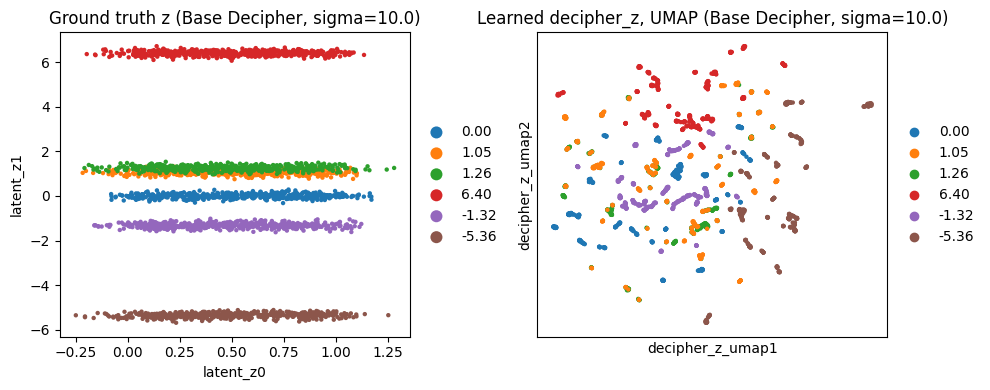

Decipher-VZ  sigma=10.0  ground truth z silhouette (by batch) = 0.5730
Decipher-VZ  sigma=10.0  learned decipher_z silhouette (by batch) = 0.6376


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


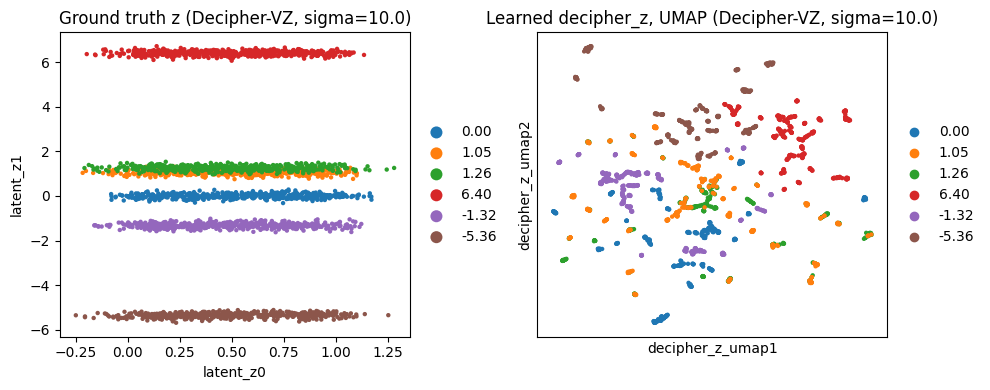

Decipher-VZ2  sigma=10.0  ground truth z silhouette (by batch) = 0.5730
Decipher-VZ2  sigma=10.0  learned decipher_z silhouette (by batch) = 0.4559


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


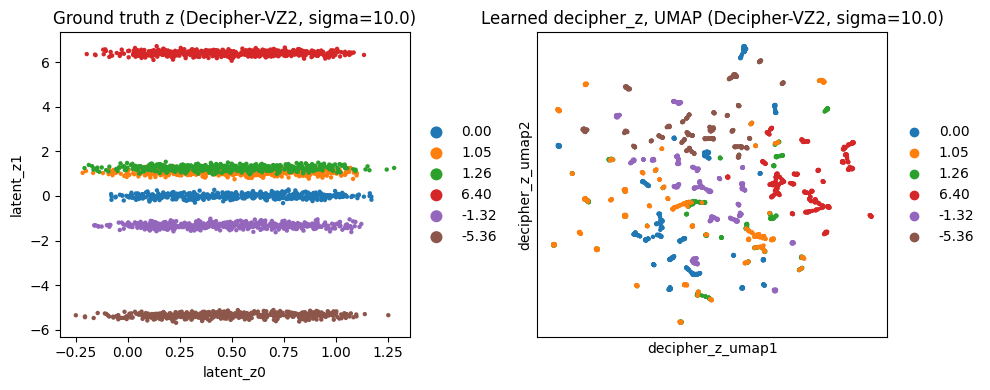

Decipher-MF  sigma=10.0  ground truth z silhouette (by batch) = 0.5730
Decipher-MF  sigma=10.0  learned decipher_z silhouette (by batch) = 0.2397


/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scipy/sparse/_index.py:151: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/Users/alanxie/miniconda3/envs/decipher_env/lib/python3.11/site-packages/scanpy/plotting/_anndata.py:521: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


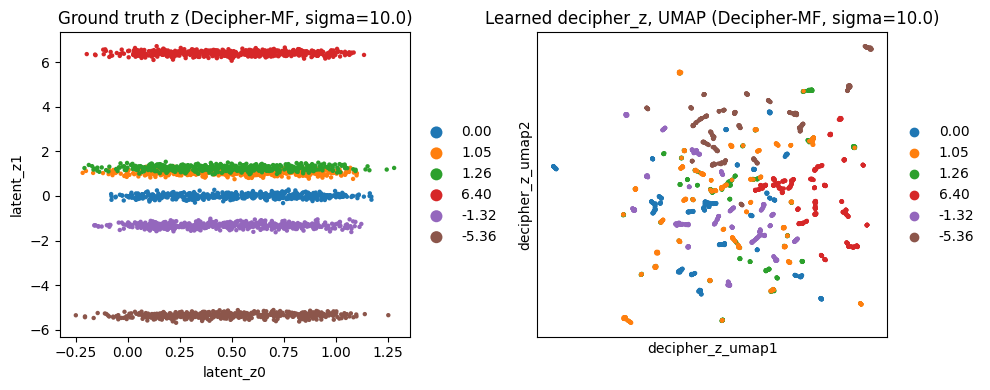

In [14]:
for model_name, (row, adata) in runs.items():
    batch_labels = adata.obs["batch"].astype(str)

    sil_ground_truth = silhouette_score(
        adata.obs[["latent_z0", "latent_z1"]].values, batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    sil_learned = silhouette_score(
        adata.obsm["decipher_z"], batch_labels,
        sample_size=min(5000, adata.n_obs), random_state=42,
    )
    print(f"{model_name}  sigma={sigma}  ground truth z silhouette (by batch) = {sil_ground_truth:.4f}")
    print(f"{model_name}  sigma={sigma}  learned decipher_z silhouette (by batch) = {sil_learned:.4f}")

    sc.pp.neighbors(adata, use_rep="decipher_z", random_state=42)
    sc.tl.umap(adata, random_state=42)
    adata.obsm["decipher_z_umap"] = adata.obsm["X_umap"]

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    sc.pl.scatter(adata, x="latent_z0", y="latent_z1", color="batch",
                  ax=axes[0], show=False, title=f"Ground truth z ({model_name}, sigma={sigma})")
    sc.pl.embedding(adata, basis="decipher_z_umap", color="batch",
                    ax=axes[1], show=False, title=f"Learned decipher_z, UMAP ({model_name}, sigma={sigma})")
    plt.tight_layout()
    plt.show()
